In [1]:
import os
import numpy as np
import torch
from datasets import load_dataset
from transformers import AutoModel
from PIL import Image
from retriever import Retriever

In [2]:
ds = load_dataset("ajinkyakolhe112/dog_breed_classification_kaggle", split="train")

In [3]:
# 初始化模型和处理器
model = AutoModel.from_pretrained("jinaai/jina-clip-v2", trust_remote_code=True)
retriever = Retriever(model, ds)

D:\AppData\huggingface\modules\transformers_modules\jinaai\jina-clip-implementation\51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9\modeling_clip.py:140: UserWarning: Flash attention is not installed. Check https://github.com/Dao-AILab/flash-attention?tab=readme-ov-file#installation-and-features for installation instructions, disabling
  warnings.warn(
D:\AppData\huggingface\modules\transformers_modules\jinaai\jina-clip-implementation\51f02de9f2cf8afcd3bac4ce996859ba96f9f8e9\modeling_clip.py:175: UserWarning: xFormers is not installed. Check https://github.com/facebookresearch/xformers?tab=readme-ov-file#installing-xformers for installation instructions, disabling
  warnings.warn(


afghan_hound


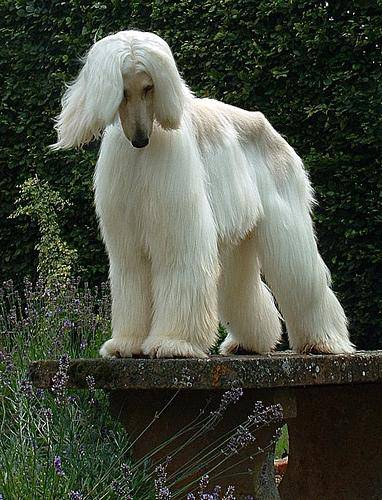

0.440956
afghan_hound


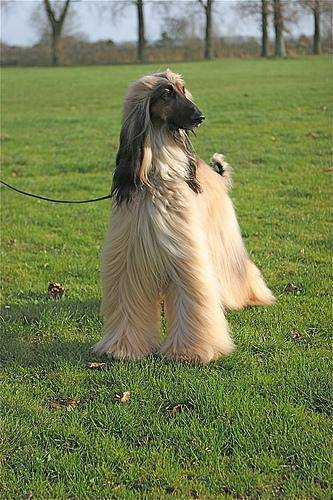

0.42967552
afghan_hound


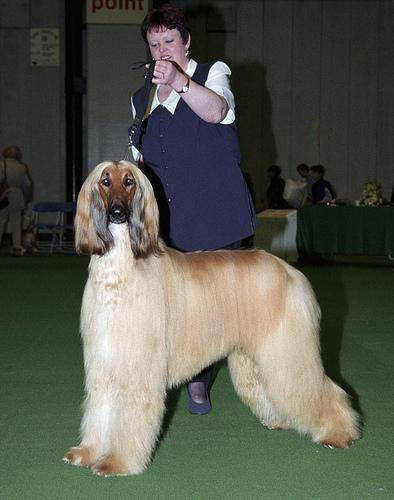

0.4229902
afghan_hound


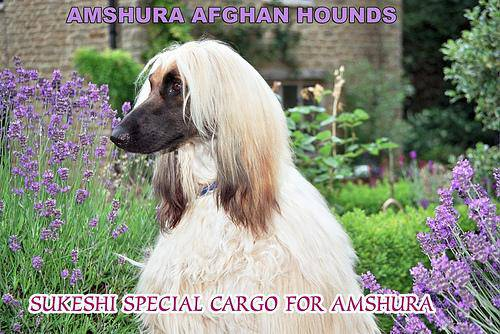

0.4151213
afghan_hound


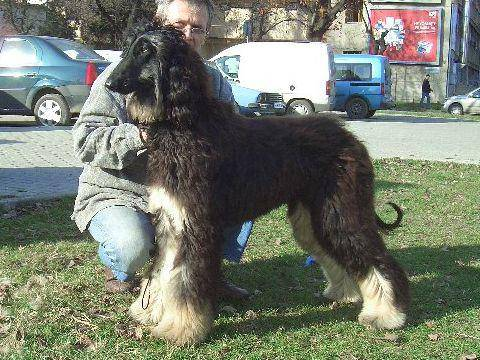

0.41313213
[(array(['prominent hipbones, large feet, and the impression of a somewhat exaggerated bend in the stifle due to profuse trouserings-stand out clearly, giving the Afghan Hound the appearance of what he'],
      dtype=object), 0.8014358), (array(['Official Standard of the Afghan Hound\n\n**General Appearance:** The Afghan Hound is an aristocrat, his whole appearance one of dignity and aloofness with no trace of plainness or coarseness. He has a straight front, proudly carried head, eyes gazing into the distance as if in memory of ages past. The striking characteristics of'],
      dtype=object), 0.69384885), (array(['**Color:** All colors are permissible, but color or color combinations are pleasing; white markings,\n\n**Gait:** When running free, the Afghan Hound moves at a gallop, showing great elasticity and spring in his smooth, powerful stride. When on a loose lead, the Afghan can trot at a fast pace; stepping along, he has the appearance of placing the hind feet directl

In [4]:
# text search
results = retriever.retrieve("afghan_hound")
for img, name, score in zip(results["images"], results["names"], results["image_similarity_scores"]):
    print(name)
    display(img)
    print(score)

print(list(zip(results["docs"], results["text_similarity_scores"])))

origin image


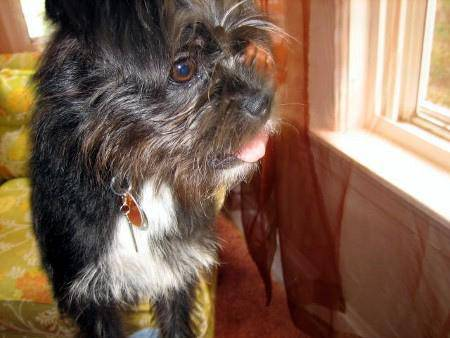

affenpinscher


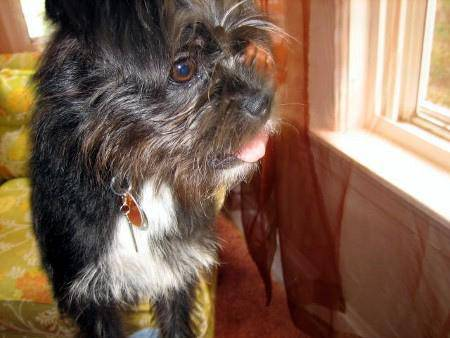

1.0000001
affenpinscher


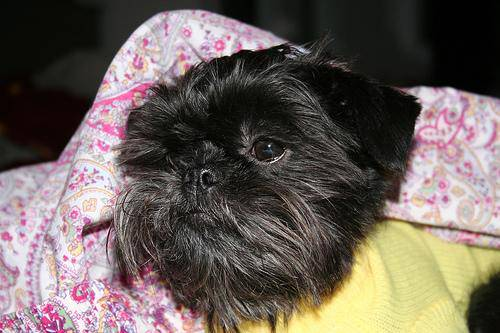

0.92527986
affenpinscher


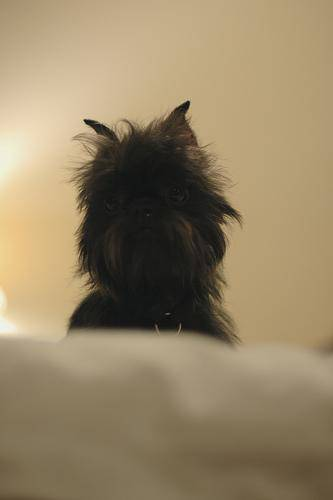

0.92214876
affenpinscher


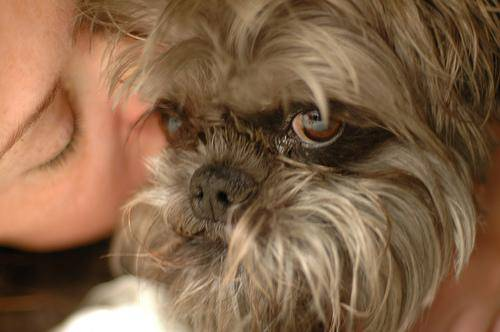

0.92013896
affenpinscher


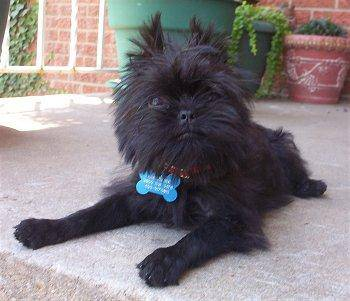

0.9190925


In [7]:
# image search
results = retriever.retrieve(ds[0]['image'])
print("origin image")
display(ds[0]['image'])

for img, name, score in zip(results["images"], results["names"], results["image_similarity_scores"]):
    print(name)
    display(img)
    print(score)

afghan_hound


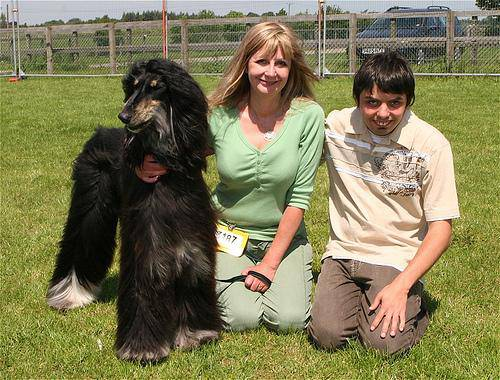

0.32959744
afghan_hound


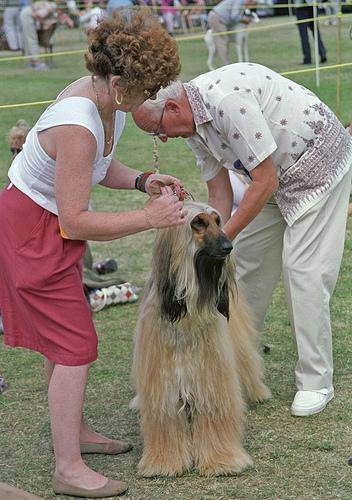

0.32268724
affenpinscher


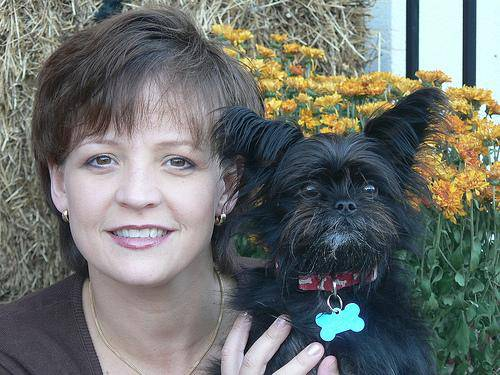

0.3172977
affenpinscher


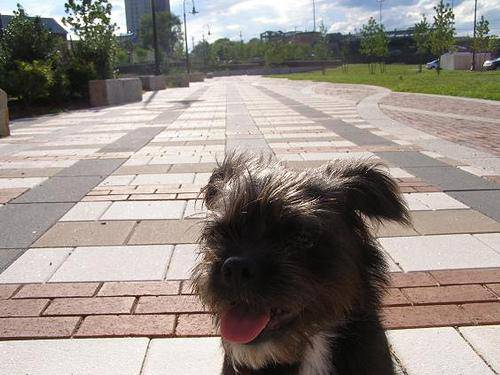

0.31530935
affenpinscher


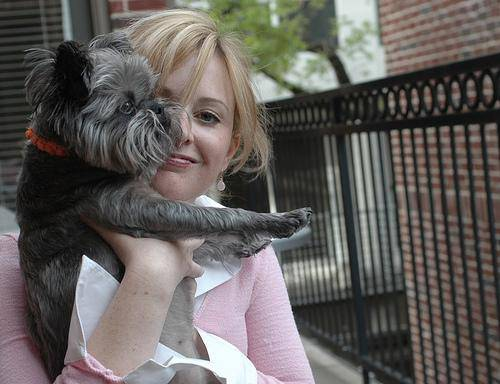

0.31309372


In [10]:
# text + text search
results = retriever.retrieve(["a shetland_sheepdog", "people"])
for img, name, score in zip(results["images"], results["names"], results["image_similarity_scores"]):
    print(name)
    display(img)
    print(score)

origin image


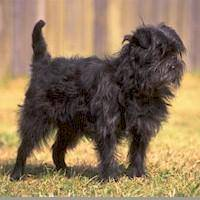

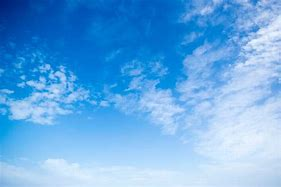

affenpinscher


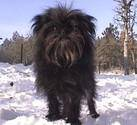

affenpinscher


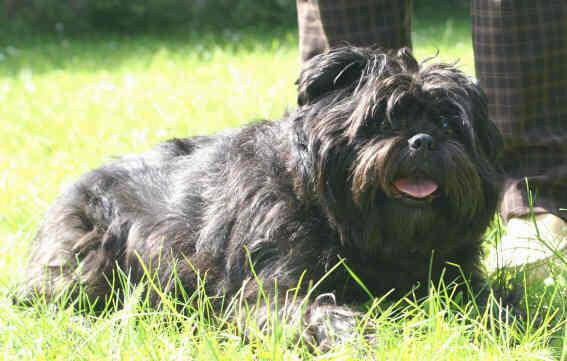

affenpinscher


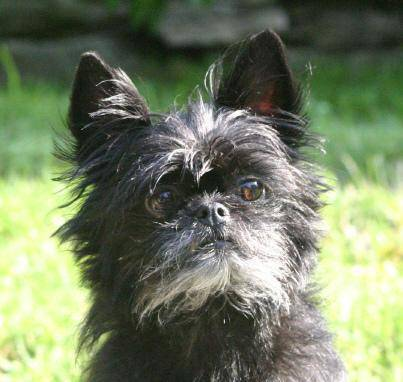

affenpinscher


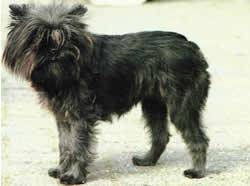

affenpinscher


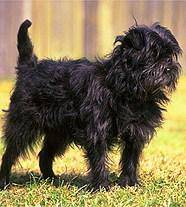

In [11]:
# image + image search
test_img1 = ds[5]['image']
test_img2 = Image.open("image.png")
results = retriever.retrieve([test_img1, test_img2], weights=[1, 5])
print("origin image")
display(test_img1)
display(test_img2)

for img, name in zip(results["images"], results["names"]):
    print(name)
    display(img)

origin image


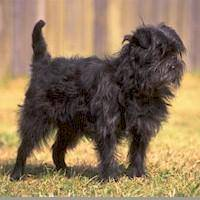

affenpinscher


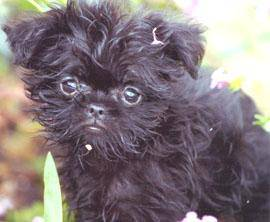

affenpinscher


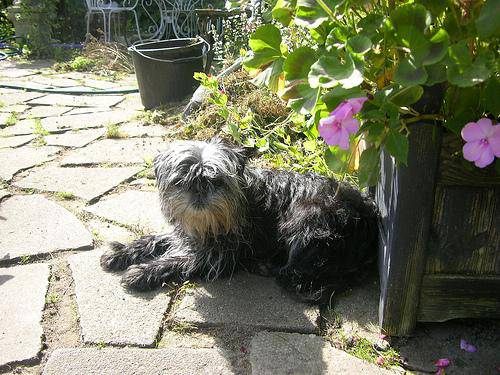

affenpinscher


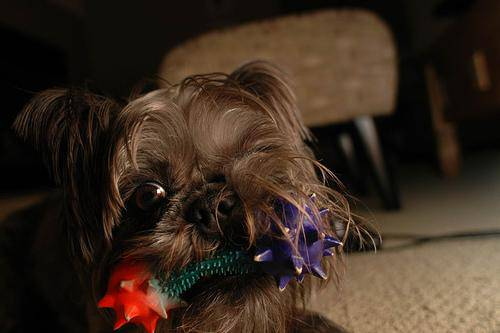

affenpinscher


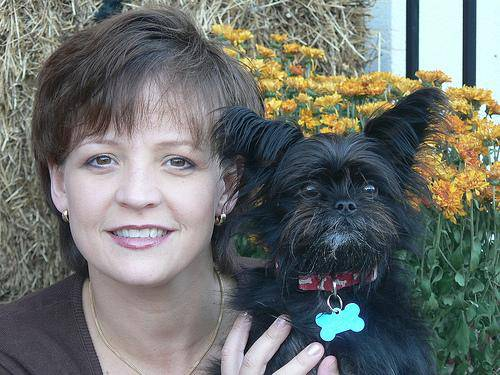

affenpinscher


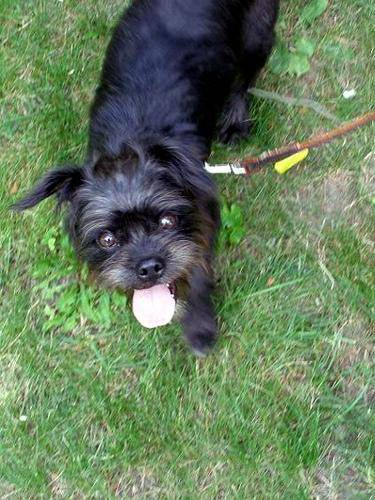

In [ ]:
# image + image search
test_img1 = ds[5]['image']
results = retriever.retrieve([test_img1, "flower"], weights=[1, 99])
print("origin image")
display(test_img1)

for img, name in zip(results["images"], results["names"]):
    print(name)
    display(img)